## Imports

In [36]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import numpy as np 
import gymnasium as gym
from typing import Callable
from matplotlib import animation
from IPython.display import HTML

## Prepare env

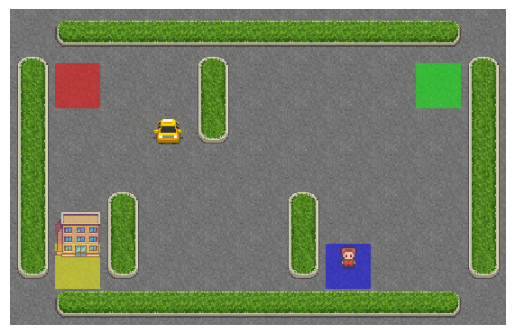

In [8]:
env = gym.make("Taxi-v3", render_mode="rgb_array")
env.reset()
plt.imshow(env.render());
plt.axis("off");

## Policy methods

In [23]:
def e_greedy_policy(q_values, state, **kwargs):
    rand = np.random.rand()
    eps = kwargs["eps"]
    if rand < eps:
        return env.action_space.sample()
    else:
        return np.argmax(q_values[state])

def greedy_policy(q_values, state, **kwargs):
    return np.argmax(q_values[state])

## Q-learning

In [92]:
class Q_learning:
    def __init__(
        self,
        env,
        policy_method: Callable,
        gamma: float = 1.0,
        alpha: float = 0.1,
        eps: float = 0.2
    ) -> None:
        self.env = env
        self.gamma = gamma
        self.policy_method = policy_method
        self.alpha = alpha
        self.eps = eps
        
        self.q_table = np.zeros(shape=(env.observation_space.n, env.action_space.n)) 
        self.scores = []

    def evaluate_policy(self, n=100) -> float:
        rewards = []

        for _ in range(n):
            state, info = env.reset()
            total_reward = 0
            done, truncated = False, False
            while not done and not truncated:
                action = self.policy_method(self.q_table, state, eps=self.eps)
                state, reward, done, truncated, info = env.step(action)

                total_reward += reward
            rewards.append(total_reward)

        return np.mean(rewards)

    def train(
        self,
        iteration_num: int = 1000,
        eval_num: int = 100
    ) -> None:
        for _ in tqdm(range(iteration_num)):

            state, info = env.reset()
            done, truncated = False, False
            step_i = 1
            while not done and not truncated:
                action = self.policy_method(self.q_table, state, eps = self.eps)

                new_state, reward, done, truncated, _ = env.step(action)
                
                discount_factor = self.gamma ** step_i
                self.q_table[state, action] += self.alpha * (reward + discount_factor * np.max(self.q_table[new_state]) - self.q_table[state, action])
                state = new_state
                step_i += 1

            score = self.evaluate_policy(n=eval_num)
            self.scores.append(score)

    def visualize_policy(self):
        state = self.env.reset()[0]
        frames = [self.env.render()]
        done, truncated = False, False

        while not done and not truncated:
            action = int(np.argmax(self.q_table[state]))

            new_state, _, done, truncated, _ = self.env.step(action)

            frames.append(self.env.render())
            state = new_state

        print("finish eval", len(frames))
        fig = plt.figure()
        def animate_func(i):
            plt.axis("off")
            im = plt.imshow(frames[i])
            
            return im

        anim = animation.FuncAnimation(
            fig, 
            animate_func, 
            frames=len(frames),
            interval=100,
        );

        return anim

In [93]:
q_learning = Q_learning(env, e_greedy_policy)

In [94]:
q_learning.train(iteration_num=10000, eval_num=10)

100%|██████████| 10000/10000 [00:31<00:00, 316.96it/s]


In [97]:
%matplotlib notebook

plt.rcParams["animation.html"] = "jshtml"
q_learning.visualize_policy()

finish eval 17


<IPython.core.display.Javascript object>

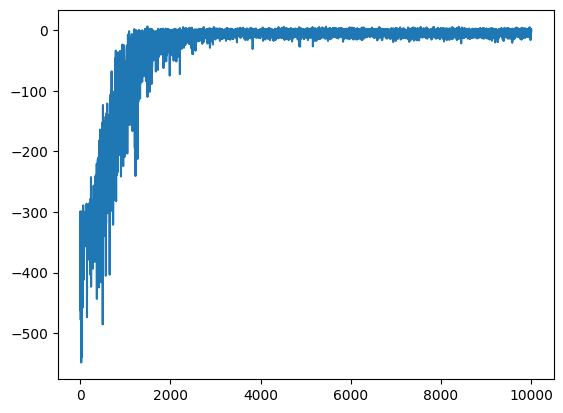

In [99]:
%matplotlib inline
plt.plot(q_learning.scores)

## Policy iteration

In [88]:
class PolicyIteration:
    def __init__(
        self,
        env,
        gamma: float = 0.95,
        alpha: float = 0.95
    ) -> None:
        self.env = env
        self.gamma = gamma
        self.alpha = alpha
        self.policy = np.random.choice(np.arange(self.env.action_space.n), self.env.observation_space.n)
        
        self.total_train_iterations: int = 0
        self.scores = []
    

    def evaluate_policy(self, n=100) -> float:
        scores = []
        for _ in range(n):
            obs, info = self.env.reset()
            total_reward = 0
            step_idx = 0
            done, truncated = False, False

            while not done and not truncated:
                
                obs, reward, done, truncated, info = self.env.step(int(self.policy[obs]))

                total_reward += (self.gamma ** step_idx * reward)
                step_idx += 1

            scores.append(total_reward)
        
        return np.mean(scores)

    def _extract_policy(self, v_func: np.ndarray) -> np.ndarray:
        """
        Get new policy according to max Q-func for each state.
        """
        policy = np.zeros(self.env.observation_space.n)
        q = np.zeros((self.env.observation_space.n, self.env.action_space.n))
        for state in self.env.get_wrapper_attr('P').keys():
            for a in self.env.get_wrapper_attr('P')[state].keys():
                q_old = q[state, a]
                q[state, a] = np.sum([
                        (1 - self.alpha) * q_old + self.alpha * p * (r + self.gamma * v_func[s])
                        for p, s, r, _ in self.env.get_wrapper_attr('P')[state][a]
                ])
            policy[state] = np.argmax(q[state, :])
        return policy

    def _compute_policy_v(self) -> np.ndarray:
        """
        Compute V - func for all states for current policy.
        """
        v_cur = np.zeros(self.env.observation_space.n)
        while True:
            v_prev = v_cur.copy()
            for state in range(self.env.observation_space.n):
                # Value of state = sum of values of all possible next states
                v_cur[state] = np.sum(
                    [p * (r + self.gamma * v_prev[s]) for p, s, r, _ in self.env.get_wrapper_attr('P')[state][self.policy[state]]]
                )
            # If V - func converges
            if np.linalg.norm(v_cur - v_prev) < 1e-10:
                break
        return v_cur

    def policy_iteration(self, iteration_num: int = 100) -> None:
        for _ in tqdm(range(iteration_num)):
            old_policy_v = self._compute_policy_v()
            new_policy = self._extract_policy(old_policy_v)

            # If new policy hasn't improved
            if (np.all(self.policy == new_policy)):
                break

            self.policy = new_policy
            
            self.total_train_iterations += 1
            score = self.evaluate_policy(n = 10)
            self.scores.append(score)
            
    def visualize_policy(self) -> HTML:
        state = self.env.reset()[0]
        frames = [self.env.render()]
        done, truncated = False, False

        while not done and not truncated:
            action = int(self.policy[state])
            
            new_state, _, done, truncated, _ = self.env.step(action)

        
            frames.append(env.render())
            state = new_state

        print("finish eval", len(frames))
        fig = plt.figure(figsize=(4,4))
        def animate_func(i):
            im = plt.imshow(frames[i])
            return im

        anim = animation.FuncAnimation(
            fig, 
            animate_func, 
            frames=len(frames),
            interval=100,
        );

        return HTML(anim.to_jshtml())

In [89]:
pi_obj = PolicyIteration(env)

In [90]:
pi_obj.policy_iteration()

 17%|█▋        | 17/100 [00:21<01:43,  1.25s/it]


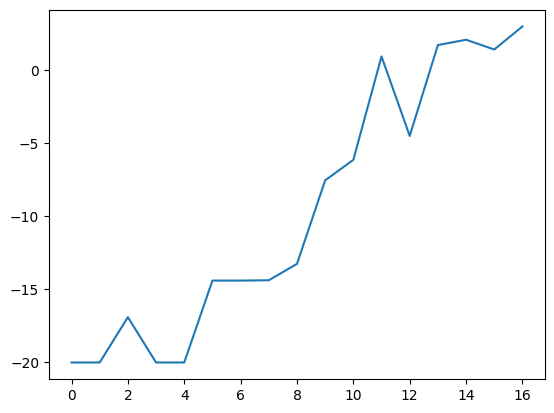

In [91]:
%matplotlib inline
plt.plot(pi_obj.scores);

In [ ]:
visualization = pi_obj.visualize_policy(); visualization